![ups logo](https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/Logo_Universidad_Polit%C3%A9cnica_Salesiana_del_Ecuador.png/640px-Logo_Universidad_Polit%C3%A9cnica_Salesiana_del_Ecuador.png)

# Aprendizaje Automático

# Practica 03

# Deep Learning con Redes Neuronales Convolucionales (CNN). Transfer Learning y Métodos Ensemble. Clasificación de Imágenes con Dataset BraTS-2024

## Parte 1: Análisis Exploratorio

### Autor: Diego Tapia

#### Instalación e importación de librerías

In [1]:
import nibabel as nib
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from skimage.transform import rotate
from skimage.util import montage
import os
from sklearn.model_selection import train_test_split
import keras
#import cv2
import tensorflow
import random
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
import numpy as np
from keras.callbacks import CSVLogger
import keras.backend as K
import zipfile
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

from skimage import measure
import nibabel as nib
import plotly.express as px

print("librerías importadas !")

2024-05-16 08:57:51.658482: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-16 08:57:53.443999: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


librerías importadas !


## Descripción del dataset

El conjunto de datos de entrenamiento proporcionado para el desafío BraTS-GoAT-2024 consiste en 2252 exploraciones de mpMRI cerebrales junto con anotaciones de segmentación de regiones tumorales. Los volúmenes 3D fueron despojados del cráneo y re-muestreados a una resolución isotrópica de 1 mm, con dimensiones de (240, 240, 155) voxels. 

Todos los escaneos mpMRI de BraTS están disponibles como archivos NIfTI (.nii.gz) y se clasifican de las siguiente forma:

* t1n: imágenes nativas 
* t1c: imágenes ponderadas en T1 post-contraste (T1Gd),
* t2w: imágenes ponderadas en T2 
* t2f: volúmenes de inversión de recuperación atenuada de fluido en T2 (T2-FLAIR)

Clasificacion tomada de (Sage Bionetworks, 2024).

T1, T2 y FLAIR son secuencias o tipos específicos de imágenes que se adquieren durante un escaneo de resonancia magnética. Cada una de estas secuencias proporciona información única sobre los tejidos y las estructuras del cuerpo, y se utilizan para diferentes propósitos en el diagnóstico médico. 

T1 (Tiempo de Repetición 1):
Las imágenes T1 son sensibles a la cantidad de protones de hidrógeno presente en los tejidos y cómo están organizados. En estas imágenes, los tejidos con alto contenido de grasa aparecen brillantes, mientras que los tejidos con alto contenido de agua, como el líquido cerebroespinal, aparecen oscuros. Las imágenes T1 son útiles para resaltar la anatomía estructural, como el cerebro, los músculos y la médula espinal. También son útiles para evaluar la presencia de lesiones hemorrágicas, ya que la sangre también aparece brillante en estas imágenes.

T2 (Tiempo de Repetición 2):
Las imágenes T2 son sensibles a cómo interactúan los protones de hidrógeno entre sí y con su entorno. En estas imágenes, los tejidos con alto contenido de agua aparecen brillantes, mientras que los tejidos con bajo contenido de agua, como la grasa, aparecen oscuros. Las imágenes T2 son excelentes para detectar edema, inflamación y cambios patológicos en los tejidos. Son útiles en la evaluación de patologías como la esclerosis múltiple, tumores cerebrales y lesiones de la médula espinal.

FLAIR (Fluid Attenuated Inversion Recovery):
Las imágenes FLAIR son una variante de las imágenes T2 que suprimen la señal del líquido cerebroespinal (CSF, por sus siglas en inglés) para mejorar la visualización de las estructuras periventriculares y subcorticales del cerebro. Al suprimir la señal del CSF, las imágenes FLAIR pueden mejorar la detección de lesiones cerebrales y proporcionar una mejor diferenciación entre la sustancia blanca y la sustancia gris en el cerebro. Son útiles en el diagnóstico de enfermedades como la esclerosis múltiple, la encefalitis y las lesiones cerebrales traumáticas.

Todas estas imagenes fueron adquiridas con diferentes protocolos clínicos de múltiples instituciones contribuyentes de datos.

#### Segmentación

Todas las imágenes han sido anotadas manualmente por uno a cuatro evaluadores, siguiendo el mismo protocolo de anotación, y sus anotaciones fueron aprobadas por neurorradiólogos experimentados. (Sage Bionetworks, 2024a)

Las anotaciones para la segmentacion consisten en cuatro clases: 

* 1 para el núcleo tumoral necrótico (NCR), 
* 2 para el tejido edematoso peritumoral (ED), 
* 3 para el tumor realresaltado (ET) y 
* 0 para el fondo (voxels que no son parte del tumor).


<img src="https://raw.githubusercontent.com/juandtap/ML_practica03_BraTS_2024/master/images/brats-segmentation.png" alt="brats-segmentation" width="1000" height="800">

*Imagen tomada de (Sage Bionetworks, 2024b)*


#### Formato de las imágenes volumétricas 

Las imágenes están en formato .nii. que son archivos NIfTI (Neuroimaging Informatics Technology Initiative). Una imagen NIfTI es una representación digital de un objeto tridimensional, como un cerebro en este caso. A continuacion se muestra la forma (shape) de una modalidad de imagen y de una segmentación:


In [3]:
# Se imprime el shape (dimensiones) de las imagenes volumetricas
main_path = './brats_training/ISBI2024-BraTS-GoAT-TrainingData/'

sample = 'BraTS-GoAT-00007/'

brain_path = sample+'BraTS-GoAT-00007-t2f.nii.gz'
seg_path = sample+'BraTS-GoAT-00007-seg.nii.gz'

im = nib.load(main_path + brain_path).get_fdata()
seg = nib.load(main_path + seg_path).get_fdata()
print(seg.shape)
print(im.shape)


(240, 240, 155)
(240, 240, 155)


Como se puede ver, las modalidades y las segmentaciones tienen 3 dimensiones. Cada dimensión está compuesta por una serie de imágenes bidimensionales, conocidas como cortes (slices), que todas contienen el mismo número de píxeles y se apilan juntas para crear esta representación en 3D.

Estas 3 dimensiones corresponden a las tres dimensiones espaciales de la imagen: ancho, alto y profundidad. En imágenes médicas, se denominan planos axial/transversal, coronal y sagital, correspondientes a las tres orientaciones principales del cuerpo humano y, por lo tanto, del cerebro. (Ovh, 2023)

<img src="https://raw.githubusercontent.com/juandtap/ML_practica03_BraTS_2024/master/images/threeviews.png" alt="planos" width="1000" height="600">

*Imagen tomada de (Ovh, 2023)*

## Análisis Exploratorio


Como se menciona anteriormente el dataset Brats cuenta con **2252** muestras de tomografías cerebrales a su vez cada muestra contiene 5 imágenes volumétricas correspondientes al tipo de mri t1n, t1c, t2w, t2f y segmentación, dando como resultado un total de **11260** imágenes volumétricas.


Nota: El dataset se carga localmente

### Visualización de una muestra 

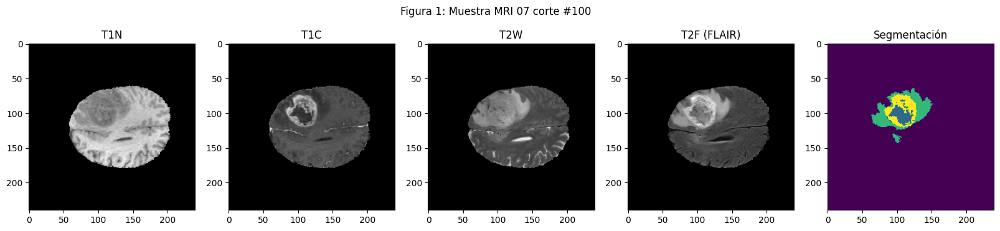

In [4]:
sample = 'BraTS-GoAT-00007/BraTS-GoAT-00007-'
sample_path = main_path+sample

# cargo las 4 images MRI y la de segmentacion
t1n_img=nib.load(sample_path + 't1n.nii.gz')
t1c_img=nib.load(sample_path + 't1c.nii.gz')
t2w_img=nib.load(sample_path + 't2w.nii.gz')
t2f_img=nib.load(sample_path + 't2f.nii.gz')
seg_img=nib.load(sample_path + 'seg.nii.gz')

t1n_data = t1n_img.get_fdata()
t1c_data = t1c_img.get_fdata()
t2w_data = t2w_img.get_fdata()
t2f_data = t2f_img.get_fdata()
seg_data = seg_img.get_fdata()

# grafico en el corte x
slice_nb = 100

fig, axs = plt.subplots(1, 5, figsize=(20,4))

axs[0].imshow(t1n_data[:,:,slice_nb], cmap="gray")
axs[0].set_title('T1N')
axs[1].imshow(t1c_data[:,:,slice_nb], cmap="gray")
axs[1].set_title('T1C')
axs[2].imshow(t2w_data[:,:,slice_nb], cmap="gray")
axs[2].set_title('T2W')
axs[3].imshow(t2f_data[:,:,slice_nb], cmap="gray")
axs[3].set_title('T2F (FLAIR)')
axs[4].imshow(seg_data[:,:,slice_nb], cmap="viridis")
axs[4].set_title('Segmentación')

fig.suptitle('Figura 1: Muestra MRI 07 corte #100')

plt.show()

Como se puede ver en la figura 1, cada muestra cuenta con 4 modalidades y una segmentacion, a continuacion se especifica para que sirve cada una:

T1N: T1 nativo, Se utiliza para mostrar la estructura y composición de diferentes tipos de tejidos en el cerebro y para identificar tumores, quistes y otras anomalías (Ovh, 2023).

T1C: T1 ponderado con contraste post-inyección (T1c, también conocido como T1Gd): Similar a las imágenes de T1 pero con la inyección de un agente de contraste (Gadolinio) que mejorará la visibilidad de las anomalías (Ovh, 2023).

T2W: T2 ponderado, se utiliza para mostrar el contenido de líquido de diferentes tipos de tejidos en el cerebro (Ovh, 2023),

T2F: T2 FLAIR (Recuperación de Inversión Atenuada de Fluido en T2): Se utiliza para suprimir este contenido de líquido. Esto puede ser útil para identificar lesiones que no son claramente visibles en las imágenes de T1 o T2, y también para identificar lesiones en la sustancia blanca del cerebro, que pueden ser difíciles de ver en otros tipos de escaneos (Ovh, 2023).

### Visualización en los tres planos, Sagital, frontal y Axial

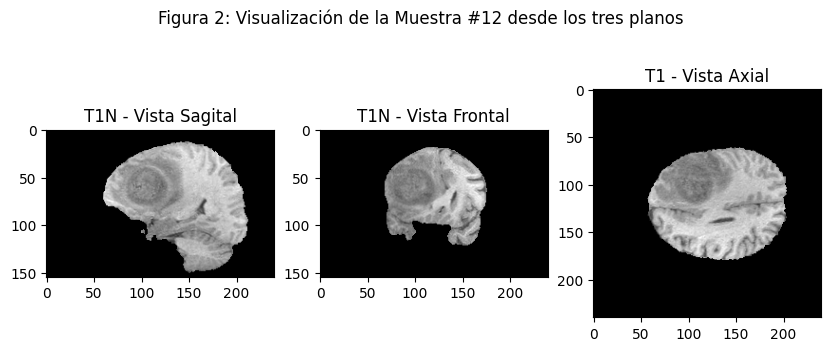

In [35]:
# se grafica una tipo de imagen en los tres planos
slice_nb = 100

fig, axs2 = plt.subplots(1, 3, figsize=(10,4))

# se rota la imagen volumetrica 90 para visualizar los tres planos en el corte 100
axs2[0].imshow(rotate(t1n_data[slice_nb,:,:], 90, resize=True), cmap="gray")
axs2[0].set_title('T1N - Vista Sagital')

axs2[1].imshow(rotate(t1n_data[:,slice_nb,:], 90, resize=True), cmap="gray")
axs2[1].set_title('T1N - Vista Frontal')

axs2[2].imshow(t1n_data[:,:,slice_nb], cmap="gray")
axs2[2].set_title('T1 - Vista Axial')
fig.suptitle("Figura 2: Visualización de la Muestra #12 desde los tres planos")
plt.show()

### Visualización de los cortes (slices)

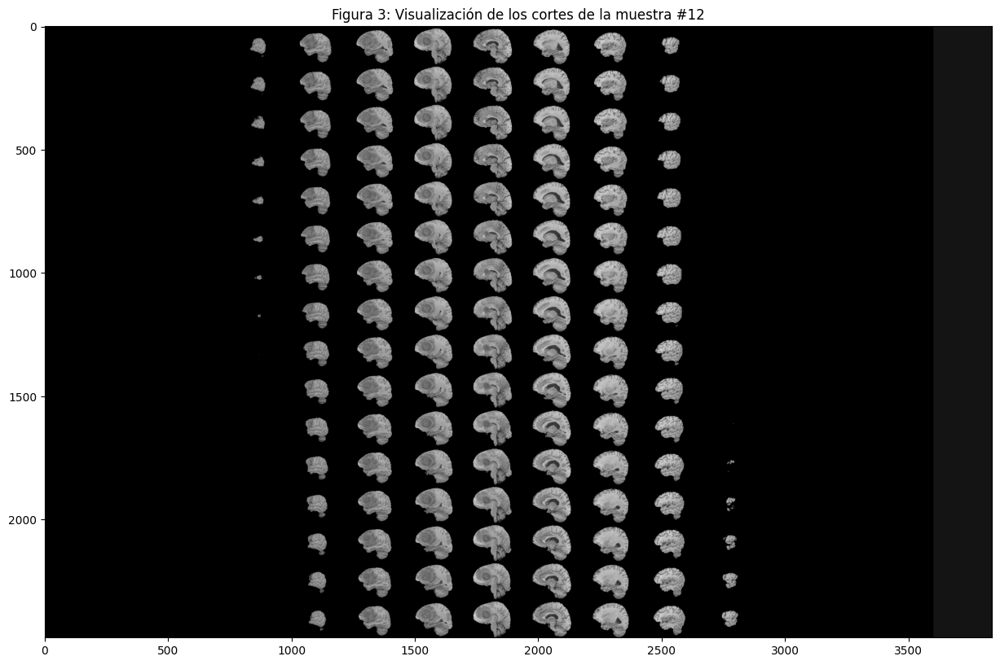

In [52]:
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(t1n_data[:,:,:]), 90, resize=True), cmap ='gray')
plt.title("Figura 3: Visualización de los cortes de la muestra #12")
plt.show()

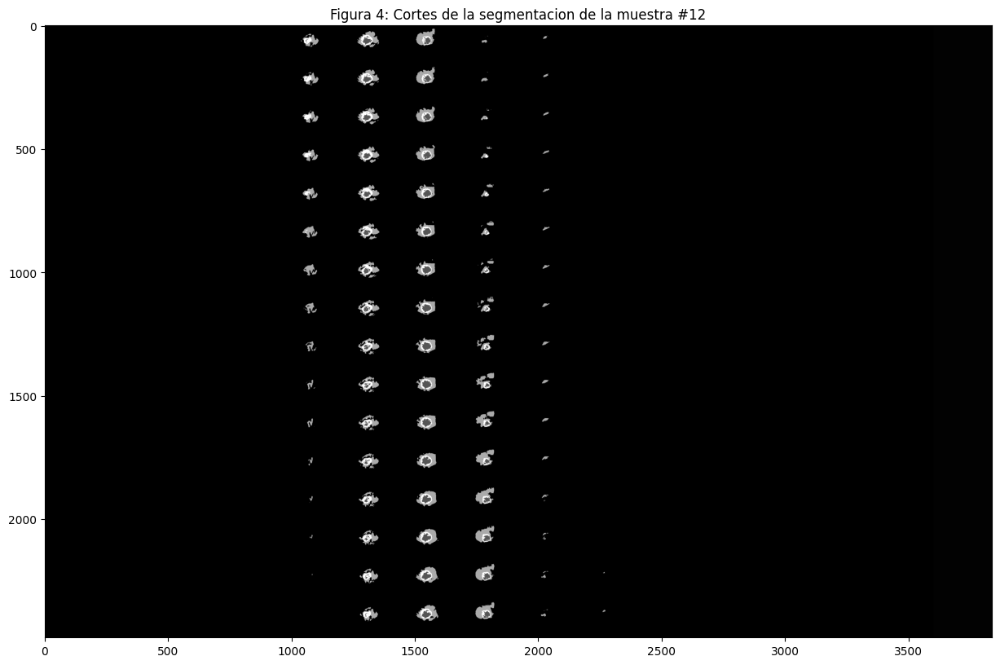

In [5]:
# cortes de la imagen de segmentacion
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(seg_data[:,:,:]), 90, resize=True), cmap ='gray')
plt.title("Figura 4: Cortes de la segmentacion de la muestra #12")
plt.show()

Como se puede observar en la figura anterior, hay dos partes negras presentes en cada lado, estas partes negras corresponden a los primeros y últimos cortes de un plano. Esto significa que una gran parte de los cortes no contiene mucha información.  

Esto se da en todas las demás modalidades, en todos los planos y también en las imágenes segmentadas por los expertos.Por eso podemos excluir estos cortes en nuestro análisis y posterior entrenamiento, para reducir el número de imágenes manipuladas.  

Se puedes ver que un rango de (60:135) se tiene los cortes con más información.

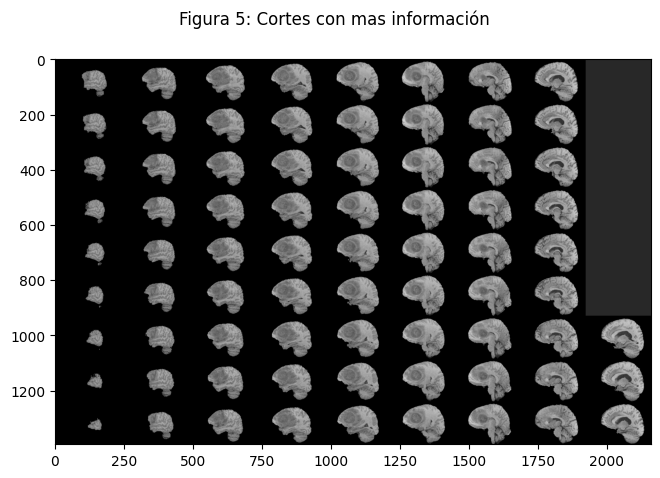

In [6]:
fig, ax1 = plt.subplots(1, 1, figsize = (15,5))
fig.suptitle("Figura 5: Cortes con mas información")
ax1.imshow(rotate(montage(t1n_data[60:135,:,:]), 90, resize=True), cmap ='gray')

Con este rango de cortes estaremos trabajando para realizar el entrenamiento y evaluación con un modelo de máquina de soporte vectorial (SVM). 

**Nota**. La idea de usar ese rango de cortes para reducir el número de imágenes a procesar fue tomada de (Ovh, 2023)

 

### Visualización de todo el cerebro

Si juntamos todos los cortes tenemos en un grafico 3D del cerebro 

In [58]:
verts, faces, normals, values = measure.marching_cubes(im, 0)
x, y, z = verts.T
i, j, k = faces.T

mesh = go.Mesh3d(x=x, y=y, z=z, opacity=0.5, i=i, j=j, k=k)
bfig = go.Figure(data=[mesh])
bfig.show()

#### Figura 6: Grafico tridimensional del cerebro 
<img src="https://raw.githubusercontent.com/juandtap/ML_practica03_BraTS_2024/master/images/brainplot.png" alt="brainplot" width="1000" height="600">

### Visualización de la segmentación 

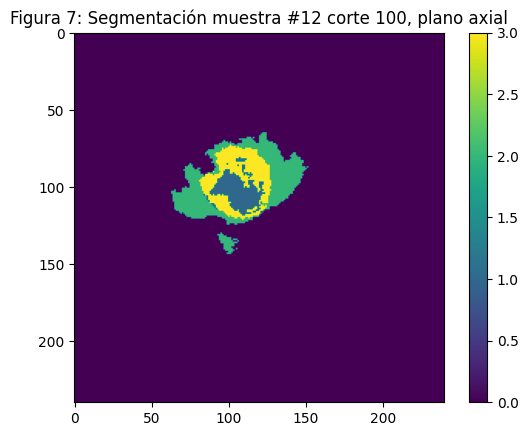

In [7]:
plt.imshow(seg_data[:,:,100])
plt.title("Figura 7: Segmentación muestra #12 corte 100, plano axial")
plt.colorbar()

Los expertos han asignado los siguientes valores a la segmentación:

- 0: No hay Tumor (NT), lo que significa Zona Saludable
- 1: Tumor Necrótico y No Realsante, Necrotic and Non-Enhancing Tumor (NCR + NET)
- 2: Edema Peritumoral (ED)
- 3: Tumor resaltado, Enhancing Tumor (ET)

El objetivo es predecir y segmentar cada una de estas 4 clases para nuevos pacientes con el fin de determinar si tienen o no un tumor cerebral y cuáles áreas están afectadas.

la distribución de estas clases en una muestra (#12) esta de la siguiente forma:

In [75]:
values, counts = np.unique(seg_data, return_counts=True)
print(values)
print(counts)


[0. 1. 2. 3.]
[8785868   20008   91981   30143]


Ahora se muestra lo que representan estas cuatro clases dentro de una imagen de segmentación.

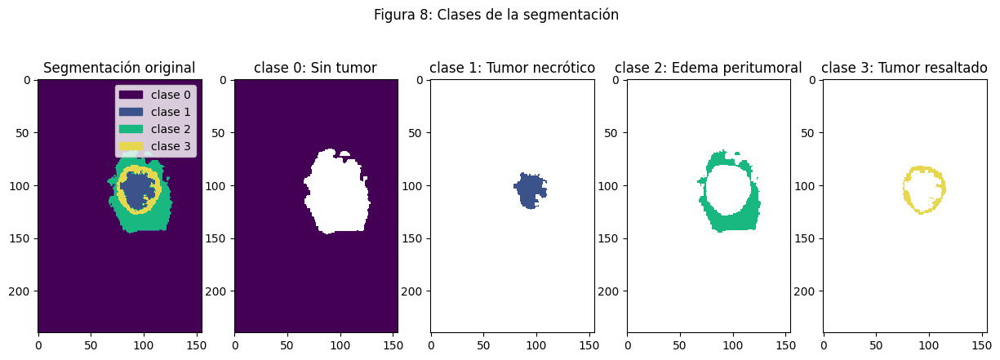

In [8]:
# Eliminacion de la clase 0 (fondo)
seg_0 = seg_data.copy()
seg_0[seg_0 != 0] = np.nan

# Isolation of class 1
seg_1 = seg_data.copy()
seg_1[seg_1 != 1] = np.nan

# Isolation of class 2
seg_2 = seg_data.copy()
seg_2[seg_2 != 2] = np.nan

# Isolation of class 4
seg_3 = seg_data.copy()
seg_3[seg_3 != 3] = np.nan

cmap = mpl.colors.ListedColormap(['#440054', '#3b528b', '#18b880', '#e6d74f'])
norm = mpl.colors.BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], cmap.N)

# Define legend
class_names = ['clase 0', 'clase 1', 'clase 2', 'clase 3']
legend = [plt.Rectangle((0, 0), 1, 1, color=cmap(i), label=class_names[i]) for i in range(len(class_names))]

fig, axs3 = plt.subplots(1, 5, figsize=(15, 5))

axs3[0].imshow(seg_data[100,:,:], cmap=cmap, norm=norm)
axs3[0].set_title('Segmentación original')
axs3[0].legend(handles=legend, loc='upper right')

axs3[1].imshow(seg_0[100,:,:], cmap=cmap, norm=norm)
axs3[1].set_title('clase 0: Sin tumor')

axs3[2].imshow(seg_1[100,:,:], cmap=cmap, norm=norm)
axs3[2].set_title('clase 1: Tumor necrótico')

axs3[3].imshow(seg_2[100,:,:], cmap=cmap, norm=norm)
axs3[3].set_title('clase 2: Edema peritumoral')

axs3[4].imshow(seg_3[100,:,:], cmap=cmap, norm=norm)
axs3[4].set_title('clase 3: Tumor resaltado')

fig.suptitle('Figura 8: Clases de la segmentación')

plt.show()

In [ ]:
# Codigo para contar las clases de segmentacion de todo el dataset
data_path = "./brats_training/ISBI2024-BraTS-GoAT-TrainingData"
seg_samples = [os.path.join(data_path, sample, f"{sample}-seg.nii.gz") for sample in os.listdir(data_path) if not sample.endswith('.csv')]


numbers_0 = 0;
numbers_1 = 0;
numbers_2 = 0;
numbers_3 = 0;


for sample in seg_samples:
    seg_img = nib.load(sample).get_fdata()
    values, _ = np.unique(seg_img, return_counts=True)
    
    for v in values:
        if v==0:
            numbers_0 += 1
        elif v==1:
            numbers_1 += 1
        elif v==2:
            numbers_2 += 1
        else:
            numbers_3 += 1


data_segmentation  = [numbers_0, numbers_1, numbers_2, numbers_3]
print(data_segmentation)


# Resultados:
# [2251, 1547, 1786, 2217]

### Análisis de frecuencias

 Se presenta un gráfico de frecuencias con los valores de la segmentación, estos valores (clases) van del 0 al 3, el numero 0 se omite porque aparte de representar una zona libre de tumores también representa el fondo de la imagen por lo que todas las segmentaciones tendrán esta etiqueta. 

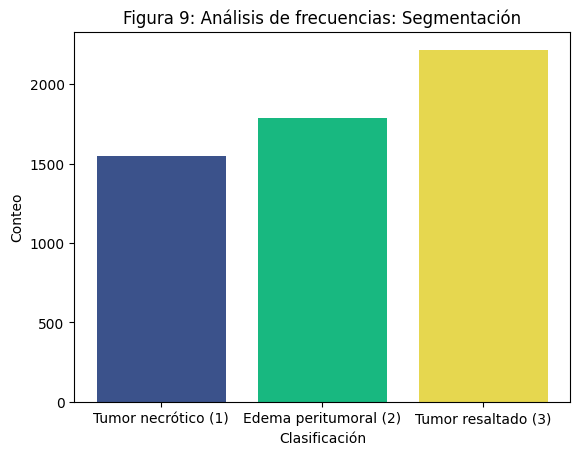

In [9]:
# Valores y etiquetas obtenidos de la celda anterior [2251, 1547, 1786, 2217]
valores = [1547, 1786, 2217]
etiquetas = ['Tumor necrótico (1)', 'Edema peritumoral (2)', 'Tumor resaltado (3)']

# Crear gráfico de barras
plt.bar(etiquetas, valores, color=['#3b528b', '#18b880', '#e6d74f'],)

# Añadir título y etiquetas
plt.title('Figura 9: Análisis de frecuencias: Segmentación')
plt.xlabel('Clasificación')
plt.ylabel('Conteo')


plt.show()


Como se puede apreciar en la figura 9 la clase de segmentación 3 Tumor resaltado o realzado (enhancing Tumor) es la que más esta presente en las imágenes segmentadas.

## Conclusiones

La primera observación que se tiene al trabajar con este dataset es que al tratarse de imágenes volumétricas se va a necesitar más recursos computacionales a la hora de entrenar modelos de clasificación especialmente en los modelos clásicos como una máquina de soporte vectorial SVM ya que estas imágenes necesitan ser convertidas a una sola dimensión para trabajar con SVMs 


Se tienen cuatro modalidades de imágenes de las cuales destacan la t1c y la t2f (FLAIR) por mostrar información relevante, lo que muestran estas imágenes son lo más cercano a lo que se tiene en la imagen de segmentación por lo que a la hora de desarrollar un modelo de clasificación se puede optar solo por considerar estas modalidades de imagen y descartar las otras ahorrando así tiempo a la hora de realizar los entrenamientos, sin embargo solo se puede asegurar que se va a reducir el tiempo mas no la precisión de la clasificación. 

También se puede observar que no todos los cortes (slices) contienen información valiosa, por lo que a la hora de realizar el entrenamiento se considerará excluir los cortes que tengan poca o ninguna información en especifico quedarnos con los cortes en el rango de (60:135) en el plano sagital. El rango de cortes con mas información fue tomado de (Ovh, 2023).


## Referencias

Ovh. (2023). ai-training-examples/notebooks/computer-vision/image-segmentation/tensorflow/brain-tumor-segmentation-unet/notebook_image_segmentation_unet.ipynb at main · ovh/ai-training-examples. GitHub. https://github.com/ovh/ai-training-examples/blob/main/notebooks/computer-vision/image-segmentation/tensorflow/brain-tumor-segmentation-unet/notebook_image_segmentation_unet.ipynb

Ortiz, I. R. H., PhD. (2023, December 23). Deep Learning con Redes Neuronales Convolucionales (CNN). Transfer Learning y Métodos Ensemble. Clasificación de Imágenes con Dataset MNIST - GenSciNet. GenSciNet. https://genscinet.com/deep-learning-cnn-ensemble-transferlearning-mnist/

Sage Bionetworks. (2024a). Synapse | Sage Bionetworks. synapse.org. https://www.synapse.org/#!Synapse:syn52939291/wiki/625695

Sage Bionetworks. (2024b). Synapse | Sage Bionetworks. https://www.synapse.org/#!Synapse:syn52939291/wiki/625694


